# Machine Learning (Python) COM SCI X 450.4 <br> (391751: Spring 2023)

### Created Date: May 10, 2023 | Created By: Esl Kim (Elsie)

### Final Updated Date: June 19, 2023 | Final Updated By: Esl Kim (Elsie)


## <ins>Final Project</ins>

The final project is a cumulative and applied assignment that requires you to collectively use the skills you’re developing. This project focuses on doing machine learning on a dataset taken from a public machine learning repository, the UCI Machine Learning Repository (or another approved dataset).

All materials must be submitted by Monday June 19 at 11:59pm.

Your notebook must include a short description of your dataset, why you are interested in it, a link to where others can access the data, and a link to documentation about the data (if different from the data access link).

The notebook must then present a clear narrative showing a substantive and specific machine learning workflow that includes:

- Importing, organizing, and processing the data
- Basic statistical analysis and/or visualizations of the data to present a general overview of the data
- Clear description of which variables will be used for machine learning
- An application of at least **three machine learning algorithms** to achieve the prediction objective
- You must use **XGBoost** for one of the algorithms
- You must use **TensorFlow** for one of the algorithms
- **Cross validation** to learn the optimum values of hyperparameters
- Measurements of how well the learned models generalize to new or test data
- A comparison of your models' results against each other
- The notebook must then end with a discussion of the advantages and disadvantages of each algorithm, an explanation of why the results may be different between them, and conclusions about what works best for your particular problem.

### <ins> Dataset</ins>
The Dataset was obtained from [UCI Machine Learning Depository](https://archive.ics.uci.edu/)

I choose [Estimation of obesity levels based on eating habits and physical condition Data Set](https://archive.ics.uci.edu/dataset/544/estimation+of+obesity+levels+based+on+eating+habits+and+physical+condition) for Predicting Obesity Levels based on Eating Habits and Physical Condition, as I would like to know how the eating habits and physical conditions are related to the Obesity level. 
In the Data Folder, there are 2 files: 
1. ObesityDataSet_raw_and_data_sinthetic.arff
2. ObesityDataSet_raw_and_data_sinthetic.csv

The arff file contains dataset description including attributes and dataset. 
The csv file include data for the estimation of obesity levels in individuals from the countries of Mexico, Peru and Colombia, based on their eating habits and physical condition. The associated tasks for this dataset were: **Classification, Regression, Clustering**.

The data contains 17 attributes and 2111 records, the records are labeled with the class variable NObesity (Obesity Level), that allows classification of the data using the values of Insufficient Weight, Normal Weight, Overweight Level I, Overweight Level II, Obesity Type I, Obesity Type II and Obesity Type III. 77% of the data was generated synthetically using the Weka tool and the SMOTE filter, 23% of the data was collected directly from users through a web platform.

The attributes are: 
- Gender {Female,Male}
- Age numeric
- Height in meter(m) | numeric
- Weight in kilogram(kg) | numeric
- family_history_with_overweight {yes,no}
- FAVC: Frequent consumption of high caloric food {yes,no} - Eating Behavior
- FCVC: Frequency of consumption of vegetables numeric - Eating Behavior {1.0 to 3.0}
- NCP: Number of main meals numeric - Eating Behavior {1.0 to 4.0}
- CAEC: Consumption of food between meals {no,Sometimes,Frequently,Always} - Eating Behavior
- SMOKE {yes,no}
- CH2O: Consumption of water daily numeric - Eating Behavior
- SCC: Calories consumption monitoring {yes,no}
- FAF: Physical activity frequency | numeric
- TUE: Time using technology devices | numeric
- CALC: Consumption of alcohol {no,Sometimes,Frequently,Always} - Eating Behavior
- MTRANS: Transportation used {Automobile,Motorbike,Bike,Public_Transportation,Walking}
- NObeyesdad {Insufficient_Weight,Normal_Weight,Overweight_Level_I,Overweight_Level_II,Obesity_Type_I,Obesity_Type_II,Obesity_Type_III}

The reference paper is titled [Dataset for estimation of obesity levels based on eating habits and physical condition in individuals from Colombia, Peru and Mexico](https://doi.org/10.1016/j.dib.2019.104344)

### <ins>Importing Required Libraries</ins>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.metrics ## accuracy_score, precision_score, recall_score
import xgboost as xgb
import tensorflow as tf

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import precision_score, recall_score, accuracy_score, f1_score

### <ins>Importing, Organizing and Preprocessing Dataset</ins>

#### 1. Importing Dataset(.csv) using *Pandas* and put it in Dataframe

In [2]:
obesity = pd.read_csv('ObesityDataSet_raw_and_data_sinthetic.csv')

In [3]:
obesity.info()
# 2111 entries and 17 columns
# No NAs

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 17 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [4]:
obesity.duplicated(keep=False) 
# Checking duplication. By setting keep on False, all duplicates are True.

0       False
1       False
2       False
3       False
4       False
        ...  
2106    False
2107    False
2108    False
2109    False
2110    False
Length: 2111, dtype: bool

#### 2. Organizing Dataset - Creating Feature Variable

**Body Mass Index (BMI)**: a measure of body fat based on height and weight that applies to adult men and women. <br>Calculation is below: 

$$
BMI = \frac{Weight(kg)}{Height(m)^2}
$$

In [5]:
obesity['BMI'] = obesity['Weight']/(obesity['Height']*obesity['Height'])

In [6]:
obesity.info()
# 2111 entries and 17 columns
# No NAs

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2111 entries, 0 to 2110
Data columns (total 18 columns):
 #   Column                          Non-Null Count  Dtype  
---  ------                          --------------  -----  
 0   Gender                          2111 non-null   object 
 1   Age                             2111 non-null   float64
 2   Height                          2111 non-null   float64
 3   Weight                          2111 non-null   float64
 4   family_history_with_overweight  2111 non-null   object 
 5   FAVC                            2111 non-null   object 
 6   FCVC                            2111 non-null   float64
 7   NCP                             2111 non-null   float64
 8   CAEC                            2111 non-null   object 
 9   SMOKE                           2111 non-null   object 
 10  CH2O                            2111 non-null   float64
 11  SCC                             2111 non-null   object 
 12  FAF                             21

In [7]:
obesity = obesity[['Gender', 'Age', 'BMI', 'Height', 'Weight', 
                   'family_history_with_overweight','NObeyesdad','SMOKE','CH2O',
                  'FAVC','FCVC','NCP','CAEC','CALC','SCC','FAF','TUE','MTRANS']]
# Reordering Column

In [8]:
obesity.head()

,Gender,Age,BMI,Height,Weight,family_history_with_overweight,NObeyesdad,SMOKE,CH2O,FAVC,FCVC,NCP,CAEC,CALC,SCC,FAF,TUE,MTRANS
0,Female,21.0,24.386526,1.62,64.0,yes,Normal_Weight,no,2.0,no,2.0,3.0,Sometimes,no,no,0.0,1.0,Public_Transportation
1,Female,21.0,24.238227,1.52,56.0,yes,Normal_Weight,yes,3.0,no,3.0,3.0,Sometimes,Sometimes,yes,3.0,0.0,Public_Transportation
2,Male,23.0,23.765432,1.80,77.0,yes,Normal_Weight,no,2.0,no,2.0,3.0,Sometimes,Frequently,no,2.0,1.0,Public_Transportation
3,Male,27.0,26.851852,1.80,87.0,no,Overweight_Level_I,no,2.0,no,3.0,3.0,Sometimes,Frequently,no,2.0,0.0,Walking
4,Male,22.0,28.342381,1.78,89.8,no,Overweight_Level_II,no,2.0,no,2.0,1.0,Sometimes,Sometimes,no,0.0,0.0,Public_Transportation


#### 3. Preprocessing Dataset - Change from Categorical to Numerical Variable

In [9]:
obesity_num = obesity.copy()

In [10]:
# Drop duplicates in the dataset
obesity_num = obesity_num.drop_duplicates()
obesity_num.shape 
# (2087, 18)

(2087, 18)

In [11]:
# Convert categorical values to Numeric values in several columns
obesity_num['Gender']=obesity_num['Gender'].replace(['Female', 'Male'],[0, 1])
obesity_num['family_history_with_overweight']=obesity_num['family_history_with_overweight'].replace(['no', 'yes'],[0, 1])
obesity_num[['FAVC','SMOKE','SCC']]=obesity_num[['FAVC','SMOKE','SCC']].replace(['no', 'yes'],[0, 1])
obesity_num[['CAEC','CALC']]=obesity_num[['CAEC','CALC']].replace(['no','Sometimes','Frequently','Always'],[0, 1, 2, 3])
obesity_num['MTRANS']=obesity_num['MTRANS'].replace([
    'Automobile','Motorbike','Bike','Public_Transportation','Walking'], [0, 1, 2, 3, 4])
obesity_num['NObeyesdad'] = obesity_num['NObeyesdad'].replace([
    'Insufficient_Weight','Normal_Weight','Overweight_Level_I',
    'Overweight_Level_II','Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'],[0, 1, 2, 3, 4, 5, 6])

In [12]:
obesity_num.head(n=20)

,Gender,Age,BMI,Height,Weight,family_history_with_overweight,NObeyesdad,SMOKE,CH2O,FAVC,FCVC,NCP,CAEC,CALC,SCC,FAF,TUE,MTRANS
0,0,21.0,24.386526,1.62,64.0,1,1,0,2.0,0,2.0,3.0,1,0,0,0.0,1.0,3
1,0,21.0,24.238227,1.52,56.0,1,1,1,3.0,0,3.0,3.0,1,1,1,3.0,0.0,3
2,1,23.0,23.765432,1.80,77.0,1,1,0,2.0,0,2.0,3.0,1,2,0,2.0,1.0,3
3,1,27.0,26.851852,1.80,87.0,0,2,0,2.0,0,3.0,3.0,1,2,0,2.0,0.0,4
4,1,22.0,28.342381,1.78,89.8,0,3,0,2.0,0,2.0,1.0,1,1,0,0.0,0.0,3
5,1,29.0,20.195092,1.62,53.0,0,1,0,2.0,1,2.0,3.0,1,1,0,0.0,0.0,0
6,0,23.0,24.444444,1.50,55.0,1,1,0,2.0,1,3.0,3.0,1,1,0,1.0,0.0,1
7,1,22.0,19.705532,1.64,53.0,0,1,0,2.0,0,2.0,3.0,1,1,0,3.0,0.0,3
8,1,24.0,20.199470,1.78,64.0,1,1,0,2.0,1,3.0,3.0,1,2,0,1.0,1.0,3
9,1,22.0,22.985398,1.72,68.0,1,1,0,2.0,1,2.0,3.0,1,0,0,1.0,1.0,3


<br>
</br>

### <ins> Basic Statistical Analysis/Visualizations to Present a General Overview of the Dataset</ins>

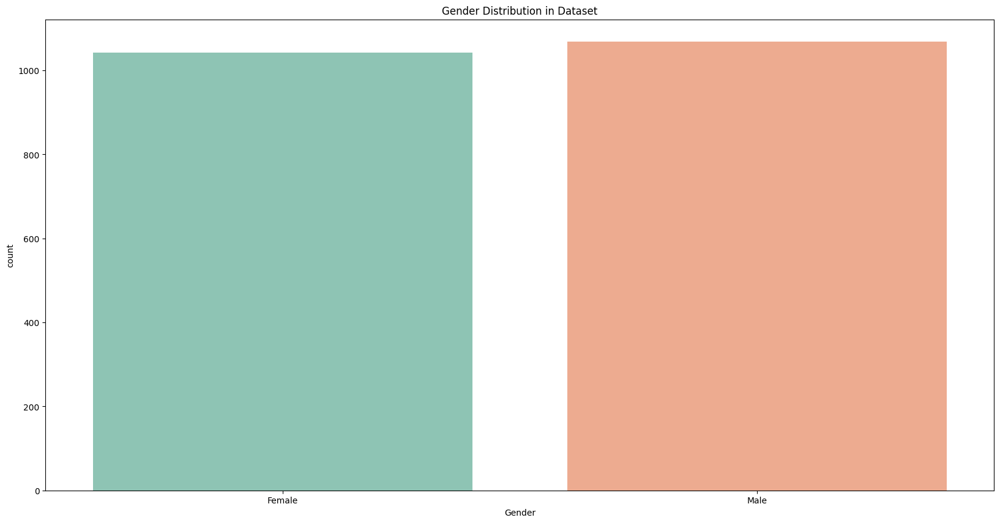

In [13]:
fig, ax = plt.subplots(figsize = (20,10))
sns.countplot(data=obesity, x= 'Gender'
            ,alpha = 0.8, palette = "Set2")
ax.set_title('Gender Distribution in Dataset')
plt.show()

In [14]:
print(obesity['Gender'].value_counts())

Gender
Male      1068
Female    1043
Name: count, dtype: int64


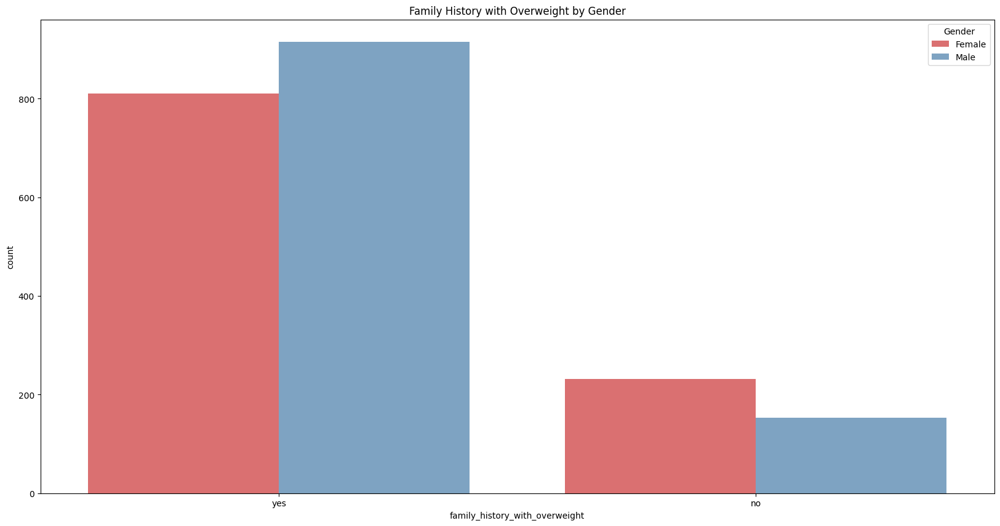

In [15]:
fig, ax = plt.subplots(figsize = (20,10))
sns.countplot(data=obesity, x= 'family_history_with_overweight'
            ,alpha = 0.7, hue = 'Gender', palette = "Set1")
ax.set_title('Family History with Overweight by Gender')
plt.show()

In [16]:
print(obesity['family_history_with_overweight'].value_counts())

family_history_with_overweight
yes    1726
no      385
Name: count, dtype: int64


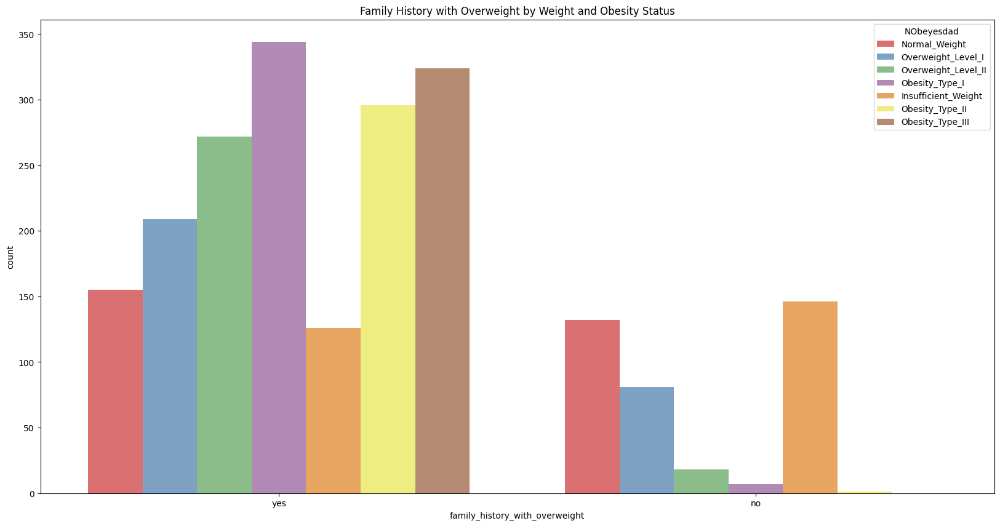

In [124]:
fig, ax = plt.subplots(figsize = (20,10))
sns.countplot(data=obesity, x= 'family_history_with_overweight'
            ,alpha = 0.7, hue = 'NObeyesdad', palette = "Set1")
ax.set_title('Family History with Overweight by Weight and Obesity Status')
plt.show()

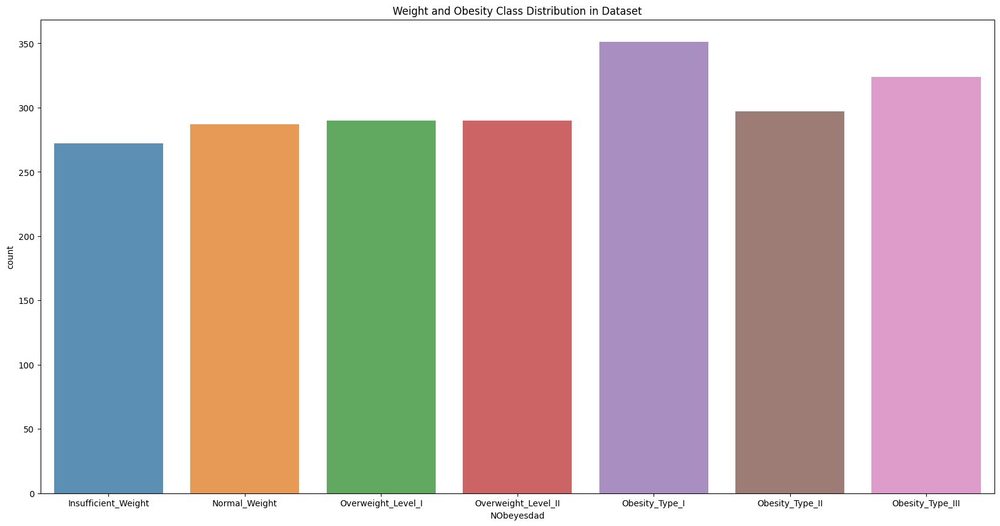

In [17]:
fig, ax = plt.subplots(figsize = (20,10))
sns.countplot(data=obesity, x= 'NObeyesdad'
            ,alpha = 0.8, order=['Insufficient_Weight','Normal_Weight','Overweight_Level_I',
    'Overweight_Level_II','Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
ax.set_title('Weight and Obesity Class Distribution in Dataset')
plt.show()

In [18]:
print(obesity['NObeyesdad'].value_counts())

NObeyesdad
Obesity_Type_I         351
Obesity_Type_III       324
Obesity_Type_II        297
Overweight_Level_I     290
Overweight_Level_II    290
Normal_Weight          287
Insufficient_Weight    272
Name: count, dtype: int64


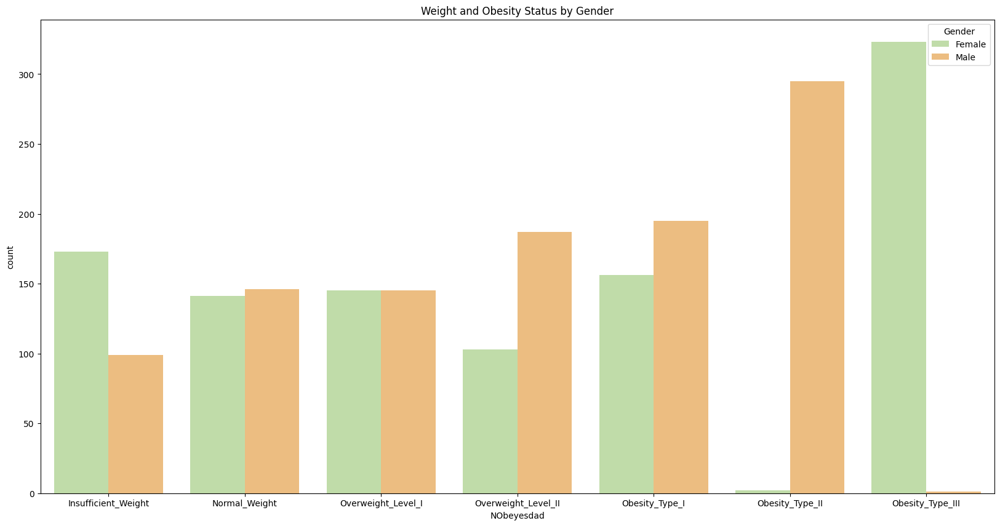

In [19]:
fig, ax = plt.subplots(figsize = (20,10))
sns.countplot(data=obesity, x= 'NObeyesdad'
            ,alpha = 1, hue = 'Gender',palette = "Spectral_r",
              order=['Insufficient_Weight','Normal_Weight','Overweight_Level_I',
    'Overweight_Level_II','Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
ax.set_title('Weight and Obesity Status by Gender')
plt.show()

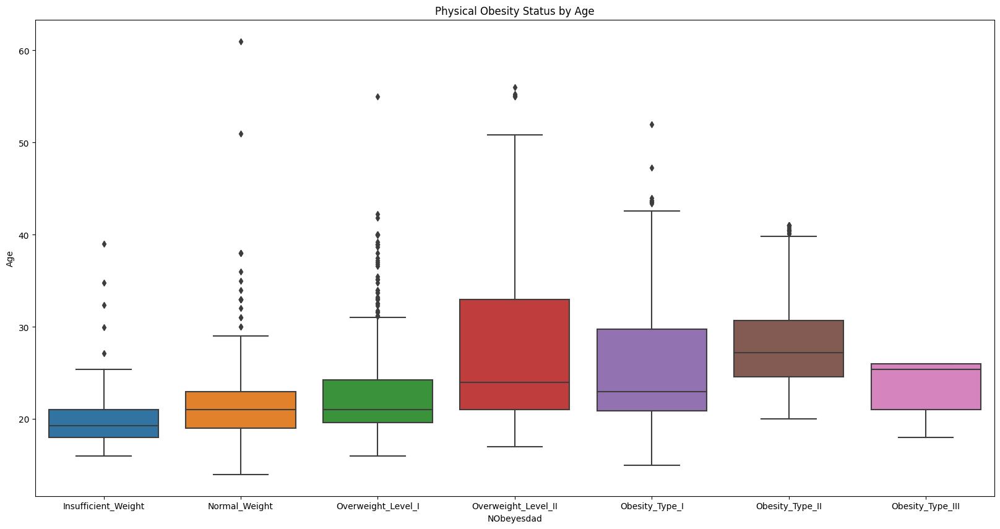

In [20]:
fig, ax = plt.subplots(figsize = (20,10))
sns.boxplot(data=obesity, x= 'NObeyesdad', y = 'Age', 
            order=['Insufficient_Weight','Normal_Weight','Overweight_Level_I',
    'Overweight_Level_II','Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
ax.set_title('Physical Weight and Obesity Status by Age')
plt.show()

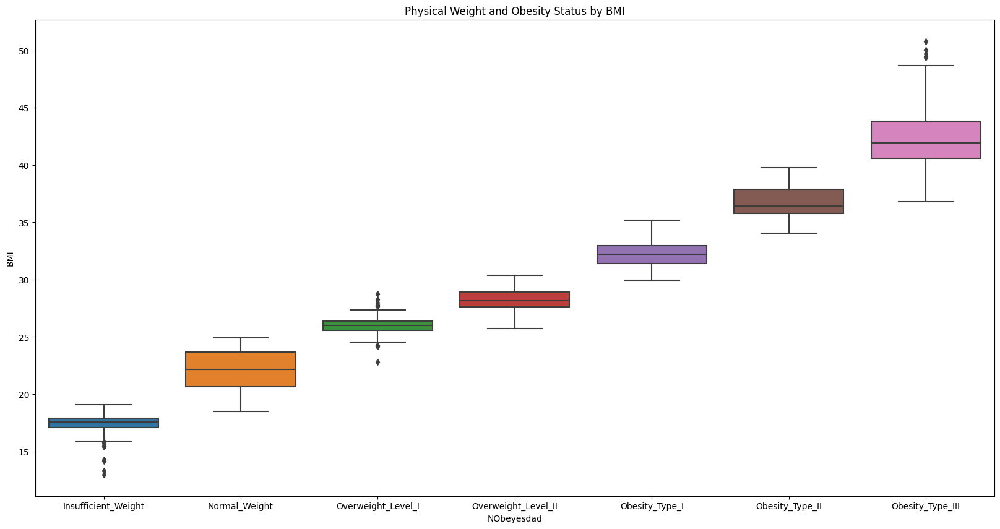

In [121]:
fig, ax = plt.subplots(figsize = (20,10))
sns.boxplot(data=obesity, x= 'NObeyesdad', y = 'BMI', 
            order=['Insufficient_Weight','Normal_Weight','Overweight_Level_I',
    'Overweight_Level_II','Obesity_Type_I','Obesity_Type_II','Obesity_Type_III'])
ax.set_title('Physical Weight and Obesity Status by BMI')
plt.show()

In [22]:
obesity_corr = obesity_num.corr() # Correlation Plot

<Axes: >

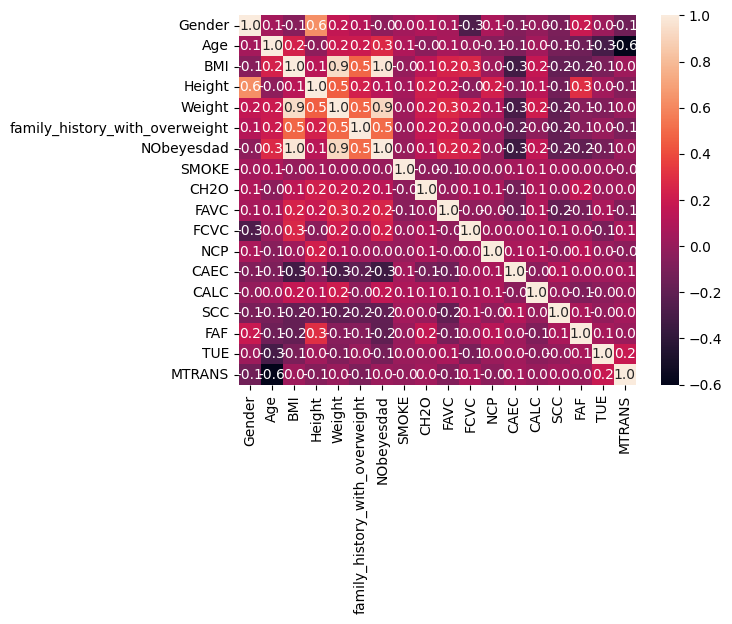

In [23]:
sns.heatmap(obesity_corr, annot = True, fmt=".1f")

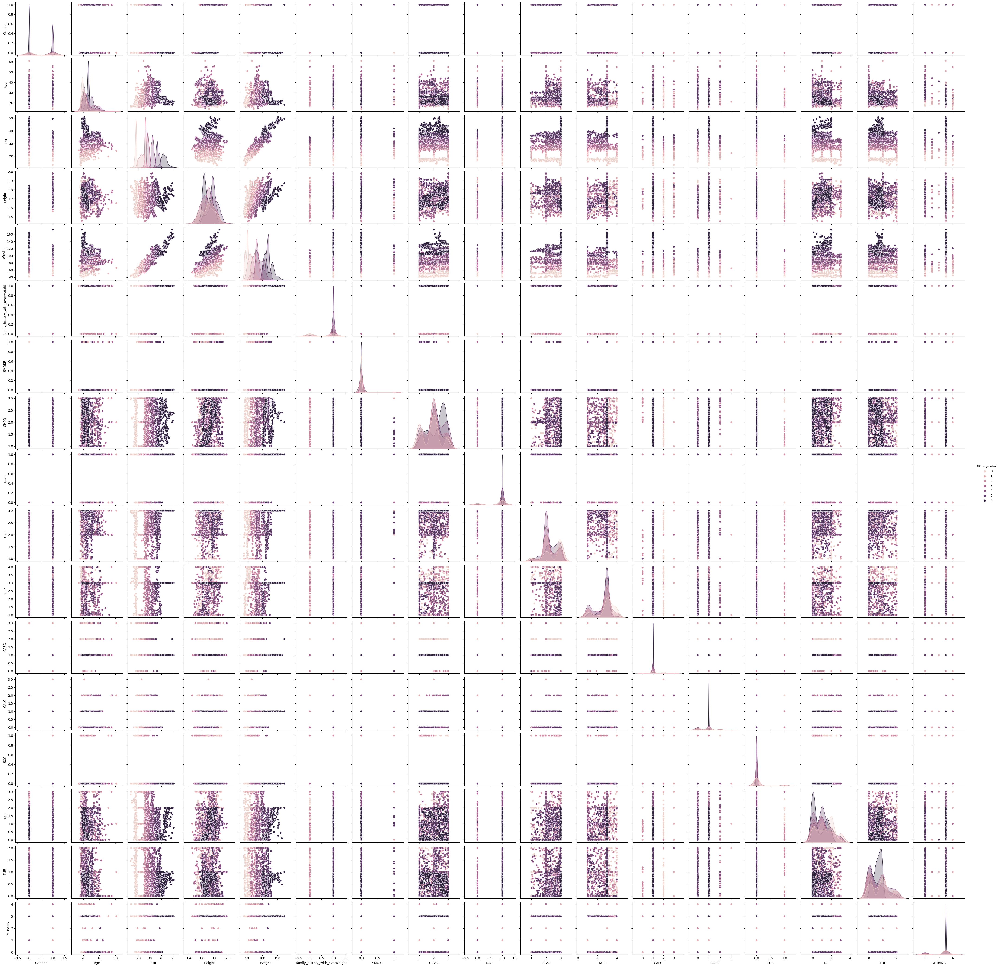

In [24]:
sns.pairplot(data=obesity_num,
             hue='NObeyesdad')

In [25]:
s = StandardScaler()
obesity_scaled = s.fit_transform(obesity_num)

# and use the scaled data when reducing the dimensionality
pca = PCA(n_components=0.95)
obesity_reduced = pca.fit_transform(obesity_scaled)

print('Number of components: ', pca.n_components_)
print('Shape of reduced obesity_scaled: ', obesity_reduced.shape)
print('Variance explained by each PC: ', pca.explained_variance_ratio_)

Number of components:  14
Shape of reduced obesity_scaled:  (2087, 14)
Variance explained by each PC:  [0.216854   0.11357767 0.09766161 0.07602193 0.06237669 0.05650397
 0.05438501 0.04902734 0.04631843 0.04518729 0.04332419 0.03893662
 0.03399314 0.03041465]


In [26]:
kmeans = KMeans(n_clusters=14, n_init=10)

# Here the fit is done on the dimensionally-reduced data, not the whole dataset
kmeans.fit(obesity_reduced)

KMeans(n_clusters=14, n_init=10)

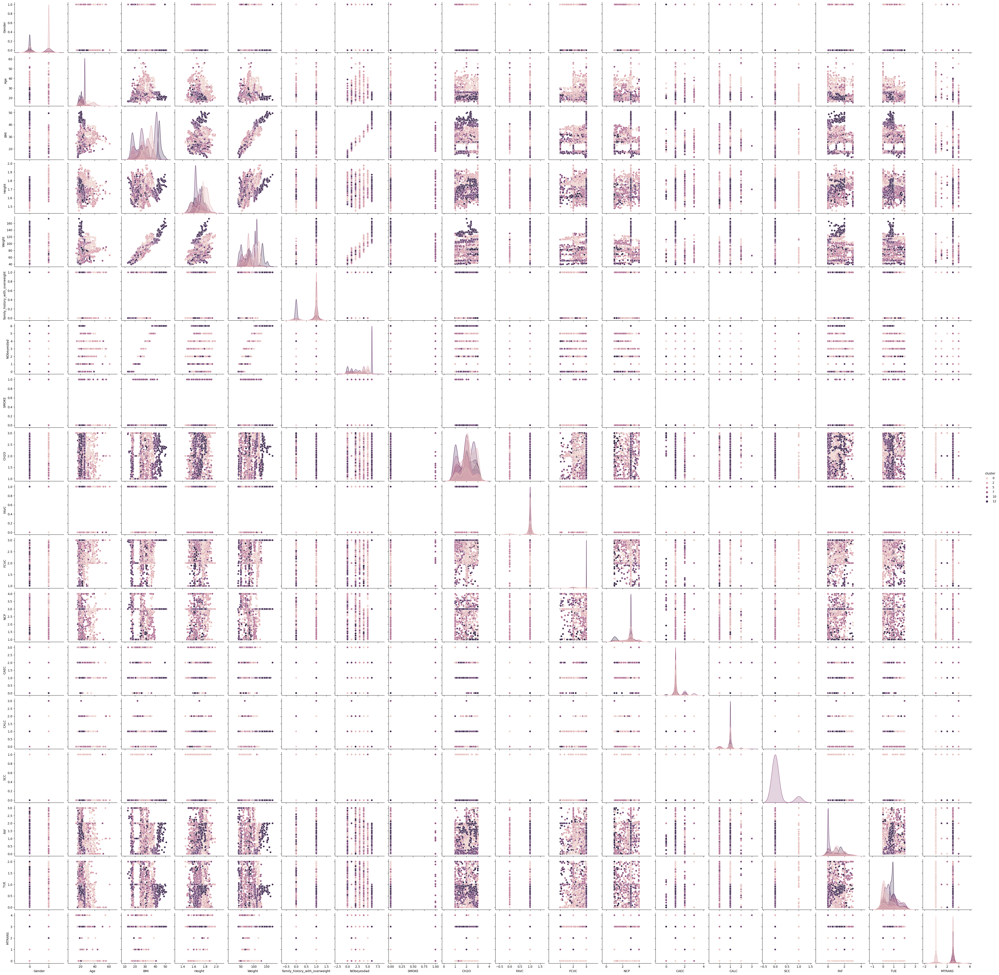

In [27]:
# add a new column to our original dataframe with the predicted cluster values
obesity_num['cluster'] = kmeans.predict(obesity_reduced)

# plot the pairplot again with color representing the predicted cluster value (not the species value!)
sns.pairplot(data=obesity_num,
             hue='cluster')

<br>
</br>

### <ins>Description of Variables will be used for Machine Learning </ins>

Select Variables To Predict Obesity Status(NObeyesdad) by choosing higher than 0.3 correlation factors. 
Out of 17 feature variables, 4 variables are selected and listed below: 
- **Age**: Physical Condition
- **BMI**: Physical Condition
- **family_history_with_overweight** :{yes,no} Physical Condition
- **CAEC**: Consumption of food between meals {no,Sometimes,Frequently,Always} - Eating Behavior

<br>
</br>

### <ins>Application of Machine Learning Algorithms for Classification</ins>

#### 1. Selecting Feature Variables into Separate Dataframe

In [28]:
df = obesity_num[["Age", "BMI", "family_history_with_overweight","CAEC","NObeyesdad"]]

In [29]:
df.head()

,Age,BMI,family_history_with_overweight,CAEC,NObeyesdad
0,21.0,24.386526,1,1,1
1,21.0,24.238227,1,1,1
2,23.0,23.765432,1,1,1
3,27.0,26.851852,0,1,2
4,22.0,28.342381,0,1,3


#### 2. Train/Test Split

In [30]:
X = df[["Age", "BMI", "family_history_with_overweight", "CAEC"]]
y = df["NObeyesdad"]

In [31]:
X = s.fit_transform(X)

In [32]:
X_train, X_test, y_train, y_test = train_test_split(X, 
                                                    y, 
                                                    test_size=0.2, 
                                                    random_state=123)

In [33]:
from sklearn.decomposition import IncrementalPCA

In [34]:
# Incremental Principal Component Analysis to select 2 features such that they explain as much variance as possible
pca = IncrementalPCA(n_components = 2)
X_train_pca = pca.fit_transform(X_train)

X_test_pca = pca.transform(X_test)

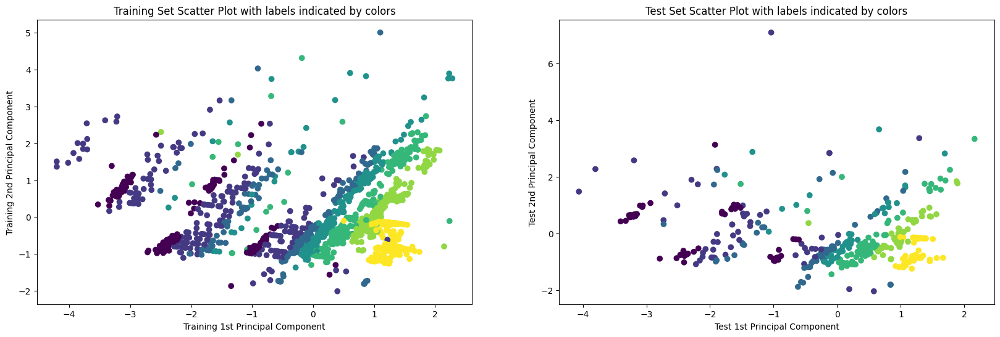

In [35]:
# Scatter Plot of Training and Test Set with labels indicated by colors
plt.figure(figsize = (20, 6))
plt.subplot(1, 2, 1)
plt.scatter(X_train_pca[:,0], X_train_pca[:,1], c = y_train)
plt.xlabel('Training 1st Principal Component')
plt.ylabel('Training 2nd Principal Component')
plt.title('Training Set Scatter Plot with labels indicated by colors')
plt.subplot(1, 2, 2)
plt.scatter(X_test_pca[:,0], X_test_pca[:,1], c = y_test)
plt.xlabel('Test 1st Principal Component')
plt.ylabel('Test 2nd Principal Component')
plt.title('Test Set Scatter Plot with labels indicated by colors')
plt.show()

<h4 style="color:red;"> 2.1. Logistic Regression</h5>

In [36]:
from sklearn.linear_model import LogisticRegression
from sklearn.inspection import DecisionBoundaryDisplay

In [37]:
para_lr = [{'max_iter':[100,500,1000,1500,2000]}]

In [38]:
model_lr=LogisticRegression(solver = 'newton-cholesky') 
# Choose this solver as there was warning for default

In [39]:
grid_search_lr=GridSearchCV(model_lr, param_grid=para_lr, cv=10, scoring='r2')

In [40]:
grid_search_lr.fit(X_train_pca, y_train)

GridSearchCV(cv=10, estimator=LogisticRegression(solver='newton-cholesky'),
             param_grid=[{'max_iter': [100, 500, 1000, 1500, 2000]}],
             scoring='r2')

In [41]:
# Best Model for Logistic Regression with Newton-cholesky Solver
modelbest_lr = grid_search_lr.best_estimator_

In [42]:
# Access the best parameters of the model
bestparams_lr = grid_search_lr.best_params_
print("Best Parameters for Logistic Regression with Newton-cholesky:", bestparams_lr)
# Best Parameters for Logistic Regression with Newton-cholesky: {'max_iter': 100}

Best Parameters for Logistic Regression with Newton-cholesky: {'max_iter': 100}


In [43]:
lr_grid_y_pred = modelbest_lr.predict(X_test_pca)

In [142]:
precis_lr_grid = precision_score(y_test, lr_grid_y_pred, average='macro')
recall_lr_grid = recall_score(y_test, lr_grid_y_pred, average='macro')
acc_lr_grid = accuracy_score(y_test, lr_grid_y_pred)
f1_lr_grid = f1_score(y_test, lr_grid_y_pred, average='macro')

# Print the Metrics - For Initial Random Forest with Grid Search Cross Validation
print(f"Precision of Logistic Regression with Grid Search Cross Validation is: {precis_lr_grid:.4%}")
print(f"Recall of Logistic Regression with Grid Search Cross Validation is: {recall_lr_grid:.4%}")
print(f"Accuracy of Logistic Regression with Grid Search Cross Validation is: {acc_lr_grid:.4%}")
print(f"F1 Score of Logistic Regression with Grid Search Cross Validation is: {f1_lr_grid:.4}")

### Macro-Averaging (average = 'macro') ##
# Precision of Logistic Regression with Grid Search Cross Validation is: 50.2307%
# Recall of Logistic Regression with Grid Search Cross Validation is: 52.1004%
# Accuracy of Logistic Regression with Grid Search Cross Validation is: 54.0670%
# F1 Score of Logistic Regression with Grid Search Cross Validation is: 0.4988

Precision of Logistic Regression with Grid Search Cross Validation is: 50.2307%
Recall of Logistic Regression with Grid Search Cross Validation is: 52.1004%
Accuracy of Logistic Regression with Grid Search Cross Validation is: 54.0670%
F1 Score of Logistic Regression with Grid Search Cross Validation is: 0.4988


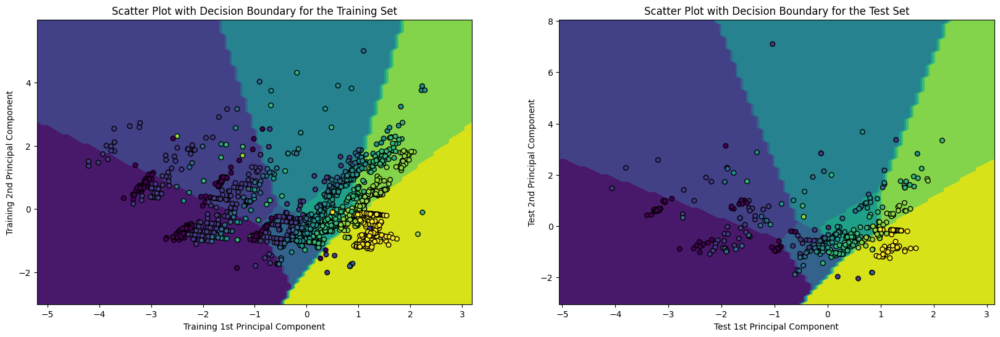

In [45]:
# plotting the decision boundary in the scatter plot of Training and Test Set with labels indicated by colors
x_min, x_max = X_train_pca[:, 0].min() - 1, X_train_pca[:, 0].max() + 1
y_min, y_max = X_train_pca[:, 1].min() - 1, X_train_pca[:, 1].max() + 1

xx_train, yy_train = np.meshgrid(np.arange(x_min, x_max, 0.1),
                                 np.arange(y_min, y_max, 0.1))

Z_train = modelbest_lr.predict(np.c_[xx_train.ravel(), yy_train.ravel()])
Z_train = Z_train.reshape(xx_train.shape)


x_min, x_max = X_test_pca[:, 0].min() - 1, X_test_pca[:, 0].max() + 1
y_min, y_max = X_test_pca[:, 1].min() - 1, X_test_pca[:, 1].max() + 1

xx_test, yy_test = np.meshgrid(np.arange(x_min, x_max, 0.1),
                               np.arange(y_min, y_max, 0.1))

Z_test = modelbest_lr.predict(np.c_[xx_test.ravel(), yy_test.ravel()])
Z_test = Z_test.reshape(xx_test.shape)


plt.figure(figsize = (20, 6))
plt.subplot(1, 2, 1)
plt.contourf(xx_train, yy_train, Z_train)
plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c = y_train, s = 30, edgecolor = 'k')
plt.xlabel('Training 1st Principal Component')
plt.ylabel('Training 2nd Principal Component')
plt.title('Scatter Plot with Decision Boundary for the Training Set')
plt.subplot(1, 2, 2)
plt.contourf(xx_test, yy_test, Z_test)
plt.scatter(X_test_pca[:, 0], X_test_pca[:, 1], c = y_test, s = 30, edgecolor = 'k')
plt.xlabel('Test 1st Principal Component')
plt.ylabel('Test 2nd Principal Component')
plt.title('Scatter Plot with Decision Boundary for the Test Set')
plt.show()

<br>

<h4 style="color:red;"> 2.2. K-Neighbors Classifier</h4>

In [46]:
from sklearn.neighbors import KNeighborsClassifier

In [189]:
model_knn = KNeighborsClassifier()

In [190]:
para_knn = {"weights":['uniform', 'distance'], "n_neighbors":range(5,11), "algorithm":['auto', 'ball_tree']}

In [191]:
grid_search_knn = GridSearchCV(model_knn, para_knn, cv=10, scoring='accuracy', return_train_score=False, verbose=1)

In [192]:
grid_search_knn.fit(X_train_pca, y_train)

Fitting 10 folds for each of 24 candidates, totalling 240 fits


GridSearchCV(cv=10, estimator=KNeighborsClassifier(),
             param_grid={'algorithm': ['auto', 'ball_tree'],
                         'n_neighbors': range(5, 11),
                         'weights': ['uniform', 'distance']},
             scoring='accuracy', verbose=1)

In [193]:
# Best Model for KNN Classifier
modelbest_knn = grid_search_knn.best_estimator_

In [194]:
# Access the best parameters of the model
bestparams_knn = grid_search_knn.best_params_
print("Best Parameters for KNN Classifier:", bestparams_knn)
# Best Parameters for KNN Classifier: {'algorithm': 'auto', 'n_neighbors': 5, 'weights': 'distance'}

Best Parameters for KNN Classifier: {'algorithm': 'auto', 'n_neighbors': 5, 'weights': 'distance'}


In [195]:
knn_grid_y_pred = modelbest_knn.predict(X_test_pca)

In [196]:
precis_knn_grid = precision_score(y_test, knn_grid_y_pred, average='macro')
recall_knn_grid = recall_score(y_test, knn_grid_y_pred, average='macro')
acc_knn_grid = accuracy_score(y_test, knn_grid_y_pred)
f1_knn_grid = f1_score(y_test, knn_grid_y_pred, average='macro')

# Print the Metrics - For Initial Random Forest with Grid Search Cross Validation
print(f"Precision of KNN Classifer Model with Grid Search Cross Validation is: {precis_knn_grid:.4%}")
print(f"Recall of KNN Classifer Model with Grid Search Cross Validation is: {recall_knn_grid:.4%}")
print(f"Accuracy of KNN Classifer Model with Grid Search Cross Validation is: {acc_knn_grid:.4%}")
print(f"F1 Score of KNN Classifer Model with Grid Search Cross Validation is: {f1_knn_grid:.4}")

### Macro-Averaging (average = 'macro') ##
# Precision of KNN Classifer Model with Grid Search Cross Validation is: 90.6155%
# Recall of KNN Classifer Model with Grid Search Cross Validation is: 90.9068%
# Accuracy of KNN Classifer Model with Grid Search Cross Validation is: 91.1483%
# F1 Score of KNN Classifer Model with Grid Search Cross Validation is: 0.9065

Precision of KNN Classifer Model with Grid Search Cross Validation is: 90.6155%
Recall of KNN Classifer Model with Grid Search Cross Validation is: 90.9068%
Accuracy of KNN Classifer Model with Grid Search Cross Validation is: 91.1483%
F1 Score of KNN Classifer Model with Grid Search Cross Validation is: 0.9065


<h4 style="color:red;"> 2.3. Decision Tree Classifier </h4>

In [55]:
from sklearn.tree import DecisionTreeClassifier

In [56]:
para_tree = {"criterion":['gini', 'entropy'], "max_depth":range(1,5), "min_samples_split":range(2,100), 
            "min_samples_leaf":range(1,50)}

In [57]:
model_tree = DecisionTreeClassifier()

In [58]:
grid_search_tree=GridSearchCV(model_tree, param_grid=para_tree, cv=10, scoring='accuracy', verbose=1, n_jobs = -1, error_score='raise')

In [59]:
grid_search_tree.fit(X_train_pca, y_train)

Fitting 10 folds for each of 38416 candidates, totalling 384160 fits


GridSearchCV(cv=10, error_score='raise', estimator=DecisionTreeClassifier(),
             n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(1, 5),
                         'min_samples_leaf': range(1, 50),
                         'min_samples_split': range(2, 100)},
             scoring='accuracy', verbose=1)

In [60]:
# Best Model for Decision Tree Classifier
modelbest_tree = grid_search_tree.best_estimator_

In [61]:
# Access the best parameters of the model
bestparams_tree = grid_search_tree.best_params_
print("Best Parameters for Decision Tree Classifier:", bestparams_tree)
# Best Parameters for Decision Tree Classifier: 
# {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2}

Best Parameters for Decision Tree Classifier: {'criterion': 'entropy', 'max_depth': 4, 'min_samples_leaf': 1, 'min_samples_split': 2}


In [62]:
tree_grid_y_pred = modelbest_tree.predict(X_test_pca)

In [63]:
precis_tree_grid = precision_score(y_test, tree_grid_y_pred, average='macro')
recall_tree_grid = recall_score(y_test, tree_grid_y_pred, average='macro')
acc_tree_grid = accuracy_score(y_test, tree_grid_y_pred)
f1_tree_grid = f1_score(y_test, tree_grid_y_pred, average='macro')

# Print the Metrics - For Initial Random Forest with Grid Search Cross Validation
print(f"Precision of Decision Tree Classifer Model with Grid Search Cross Validation is: {precis_tree_grid:.4%}")
print(f"Recall of Decision Tree Classifer Model with Grid Search Cross Validation is: {recall_tree_grid:.4%}")
print(f"Accuracy of Decision Tree Classifer Model with Grid Search Cross Validation is: {acc_tree_grid:.4%}")
print(f"F1 Score of Decision Tree Classifer Model with Grid Search Cross Validation is: {f1_tree_grid:.4}")

# Precision of Decision Tree Classifer Model with Grid Search Cross Validation is: 72.2099%
# Recall of Decision Tree Classifer Model with Grid Search Cross Validation is: 69.1713%
# Accuracy of Decision Tree Classifer Model with Grid Search Cross Validation is: 71.2919%
# F1 Score of Decision Tree Classifer Model with Grid Search Cross Validation is: 0.6905

Precision of Decision Tree Classifer Model with Grid Search Cross Validation is: 72.2099%
Recall of Decision Tree Classifer Model with Grid Search Cross Validation is: 69.1713%
Accuracy of Decision Tree Classifer Model with Grid Search Cross Validation is: 71.2919%
F1 Score of Decision Tree Classifer Model with Grid Search Cross Validation is: 0.6905


<br>

<h4 style="color:red;"> 2.4. Random Forest Classifier </h4>

In [64]:
from sklearn.ensemble import RandomForestClassifier

In [172]:
para_rf = {'n_estimators': [100, 500],  
                  'min_samples_split': [2, 5, 10],
                  'random_state': [None, 42]}

In [173]:
model_rf = RandomForestClassifier()

In [174]:
grid_search_rf = GridSearchCV(model_rf, para_rf, scoring='accuracy', cv=10, error_score='raise')

In [175]:
grid_search_rf.fit(X_train_pca, y_train)

GridSearchCV(cv=10, error_score='raise', estimator=RandomForestClassifier(),
             param_grid={'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 500],
                         'random_state': [None, 42]},
             scoring='accuracy')

In [176]:
# Best Model
model_best_rf = grid_search_rf.best_estimator_

In [177]:
# Access the best parameters of the model
bestparams_rf = grid_search_rf.best_params_
print("Best Parameters for Random Forest:", bestparams_rf)
# Best Parameters for Random Forest: {'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}

Best Parameters for Random Forest: {'min_samples_split': 2, 'n_estimators': 100, 'random_state': 42}


In [178]:
rf_grid_y_pred = model_best_rf.predict(X_test_pca)

In [179]:
precis_rf_grid = precision_score(y_test, rf_grid_y_pred, average='macro')
recall_rf_grid = recall_score(y_test, rf_grid_y_pred, average='macro')
acc_rf_grid = accuracy_score(y_test, rf_grid_y_pred)
f1_rf_grid = f1_score(y_test, rf_grid_y_pred, average='macro')

# Print the Metrics - Random Forest with Grid Search Cross Validation
print(f"Precision of Random Forest Model with Grid Search Cross Validation is: {precis_rf_grid:.4%}")
print(f"Recall of Random Forest Model with Grid Search Cross Validation is: {recall_rf_grid:.4%}")
print(f"Accuracy of Random Forest Model with Grid Search Cross Validation is: {acc_rf_grid:.4%}")
print(f"F1 Score of Random Forest Model with Grid Search Cross Validation is: {f1_rf_grid:.4}")

# Precision of Random Forest Model with Grid Search Cross Validation is: 88.7331%
# Recall of Random Forest Model with Grid Search Cross Validation is: 88.4984%
# Accuracy of Random Forest Model with Grid Search Cross Validation is: 88.9952%
# F1 Score of Random Forest Model with Grid Search Cross Validation is: 0.8841

Precision of Random Forest Model with Grid Search Cross Validation is: 88.7331%
Recall of Random Forest Model with Grid Search Cross Validation is: 88.4984%
Accuracy of Random Forest Model with Grid Search Cross Validation is: 88.9952%
F1 Score of Random Forest Model with Grid Search Cross Validation is: 0.8841


<br>

<h4 style="color:red;"> 2.5. XGBoost Classifer </h4>

In [73]:
from xgboost import XGBClassifier

In [74]:
para_xgb = {'n_estimators': range(100, 1000, 100),'num_class': [7], 'num_round': [10], 'max_depth': range (2, 10, 1)}

In [75]:
model_xgb = XGBClassifier(objective ='multi:softmax')

In [76]:
grid_search_xgb = GridSearchCV(model_xgb, para_xgb, scoring='accuracy', cv=10)

In [77]:
grid_search_xgb.fit(X_train_pca, y_train) # Around 9 min 

[13:23:17] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "num_round" } are not used.

[13:23:17] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "num_round" } are not used.

[13:23:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "num_round" } are not used.

[13:23:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "num_round" } are not used.

[13:23:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11.0-arm64-cpython-38/xgboost/src/learner.cc:767: 
Parameters: { "num_round" } are not used.

[13:23:18] WARNING: /Users/runner/work/xgboost/xgboost/python-package/build/temp.macosx-11

GridSearchCV(cv=10,
             estimator=XGBClassifier(base_score=None, booster=None,
                                     callbacks=None, colsample_bylevel=None,
                                     colsample_bynode=None,
                                     colsample_bytree=None,
                                     early_stopping_rounds=None,
                                     enable_categorical=False, eval_metric=None,
                                     feature_types=None, gamma=None,
                                     gpu_id=None, grow_policy=None,
                                     importance_type=None,
                                     interaction_constraints=None,
                                     learning_rate=None...
                                     max_cat_to_onehot=None,
                                     max_delta_step=None, max_depth=None,
                                     max_leaves=None, min_child_weight=None,
                                     missing=nan, monotone_constraints=None,
                                     n_estimators=100, n_jobs=None,
                                     num_parallel_tree=None,
                                     objective='multi:softmax', predictor=None, ...),
             param_grid={'max_depth': range(2, 10),
                         'n_estimators': range(100, 1000, 100),
                         'num_class': [7], 'num_round': [10]},
             scoring='accuracy')

In [78]:
# Best Model for Decision Tree Classifier
modelbest_xgb = grid_search_xgb.best_estimator_

In [79]:
# Access the best parameters of the model
bestparams_xgb = grid_search_xgb.best_params_
print("Best Parameters for XGBoost:", bestparams_xgb)
# Best Parameters for XGBoost: {'max_depth': 5, 'n_estimators': 200, 'num_class': 7, 'num_round': 10}

Best Parameters for XGBoost: {'max_depth': 5, 'n_estimators': 200, 'num_class': 7, 'num_round': 10}


In [80]:
xgb_grid_y_pred = modelbest_xgb.predict(X_test_pca)

In [81]:
precis_xgb_grid = precision_score(y_test, xgb_grid_y_pred, average='macro')
recall_xgb_grid = recall_score(y_test, xgb_grid_y_pred, average='macro')
acc_xgb_grid = accuracy_score(y_test, xgb_grid_y_pred)
f1_xgb_grid = f1_score(y_test, xgb_grid_y_pred, average='macro')

# Print the Metrics - For XGBoost Classifer with Grid Search Cross Validation
print(f"Precision of XGBoost Classifer Model with Grid Search Cross Validation is: {precis_xgb_grid:.4%}")
print(f"Recall of XGBoost Classifer Model with Grid Search Cross Validation is: {recall_xgb_grid:.4%}")
print(f"Accuracy of XGBoost Classifer Model with Grid Search Cross Validation is: {acc_xgb_grid:.4%}")
print(f"F1 Score of XGBoost Classifer Model with Grid Search Cross Validation is: {f1_xgb_grid:.4}")

# Precision of XGBoost Classifer Model with Grid Search Cross Validation is: 88.2810%
# Recall of XGBoost Classifer Model with Grid Search Cross Validation is: 87.4813%
# Accuracy of XGBoost Classifer Model with Grid Search Cross Validation is: 88.0383%
# F1 Score of XGBoost Classifer Model with Grid Search Cross Validation is: 0.8755

Precision of XGBoost Classifer Model with Grid Search Cross Validation is: 88.2810%
Recall of XGBoost Classifer Model with Grid Search Cross Validation is: 87.4813%
Accuracy of XGBoost Classifer Model with Grid Search Cross Validation is: 88.0383%
F1 Score of XGBoost Classifer Model with Grid Search Cross Validation is: 0.8755


<br>

<h4 style="color:red;"> 2.6. Tensorflow | Dense Neural Network</h4>

In [82]:
from tensorflow import keras
from keras import models
from keras import layers
from keras import optimizers
from scikeras.wrappers import KerasClassifier

In [83]:
model_tf = models.Sequential()

Metal device set to: Apple M2


In [84]:
model_tf.add(layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)))
model_tf.add(layers.Dense(64, activation='relu'))
model_tf.add(layers.Dense(7, activation='softmax'))

In [85]:
model_tf.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

In [86]:
model_tf.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense (Dense)               (None, 512)               2560      
                                                                 
 dense_1 (Dense)             (None, 64)                32832     
                                                                 
 dense_2 (Dense)             (None, 7)                 455       
                                                                 
Total params: 35,847
Trainable params: 35,847
Non-trainable params: 0
_________________________________________________________________


In [87]:
# Make labels to Categorical Values
from tensorflow.keras.utils import to_categorical

In [88]:
y_trainc = to_categorical(y_train)
y_testc = to_categorical(y_test)

In [89]:
print(X_train.shape)
print(y_trainc.shape)

(1669, 4)
(1669, 7)


In [90]:
model_tf.fit(X_train, y_trainc,epochs=11, batch_size=128, verbose=1)

Epoch 1/11


2023-06-19 13:33:51.269224: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz


14/14 [==============================] - 0s 6ms/step - loss: 1.5893 - accuracy: 0.3829
Epoch 2/11
14/14 [==============================] - 0s 5ms/step - loss: 1.2462 - accuracy: 0.4254
Epoch 3/11
14/14 [==============================] - 0s 5ms/step - loss: 1.1201 - accuracy: 0.5285
Epoch 4/11
14/14 [==============================] - 0s 4ms/step - loss: 1.0285 - accuracy: 0.6081
Epoch 5/11
14/14 [==============================] - 0s 5ms/step - loss: 0.9566 - accuracy: 0.6357
Epoch 6/11
14/14 [==============================] - 0s 5ms/step - loss: 0.8842 - accuracy: 0.6932
Epoch 7/11
14/14 [==============================] - 0s 5ms/step - loss: 0.8201 - accuracy: 0.7286
Epoch 8/11
14/14 [==============================] - 0s 5ms/step - loss: 0.7666 - accuracy: 0.7765
Epoch 9/11
14/14 [==============================] - 0s 5ms/step - loss: 0.7101 - accuracy: 0.7567
Epoch 10/11
14/14 [==============================] - 0s 5ms/step - loss: 0.6609 - accuracy: 0.7729
Epoch 11/11
14/14 [===========

In [91]:
y_pred_tf = model_tf.predict(X_test)

14/14 [==============================] - 0s 1ms/step


In [92]:
y_pred_class = np.argmax(y_pred_tf, axis=1)

In [93]:
y_test_class = np.argmax(y_testc, axis=1)

In [94]:
precis_grid_tf = precision_score(y_test_class, y_pred_class, average='macro', zero_division=1)
recall_grid_tf = recall_score(y_test_class, y_pred_class, average='macro')
acc_grid_tf = accuracy_score(y_test_class, y_pred_class)
f1_grid_tf = f1_score(y_test_class, y_pred_class, average='macro')

# Print the Metrics - For Tensorflow Classifer with Grid Search Cross Validation
print(f"Precision of Tensorflow Classifer Model: {precis_grid_tf:.4%}")
print(f"Recall of Tensorflow Classifer Model: {recall_grid_tf:.4%}")
print(f"Accuracy of Tensorflow Classifer Model: {acc_grid_tf:.4%}")
print(f"F1 Score of Tensorflow Classifer Model: {f1_grid_tf:.4}")

# Precision of Tensorflow Classifer Model with Grid Search Cross Validationis: 84.4196%
# Recall of Tensorflow Classifer Model with Grid Search Cross Validation is: 82.8698%
# Accuracy of Tensorflow Classifer Model with Grid Search Cross Validation is: 83.9713%
# F1 Score of Tensorflow Classifer Model with Grid Search Cross Validation is: 0.8321

Precision of Tensorflow Classifer Model: 84.4677%
Recall of Tensorflow Classifer Model: 82.7725%
Accuracy of Tensorflow Classifer Model: 83.7321%
F1 Score of Tensorflow Classifer Model: 0.8226


**Using GridSearchCV**

In [95]:
def newModel(hidden_units=64, optimizer='adam'):
    model = models.Sequential()
    model.add(layers.Dense(512, activation='relu', input_shape=(X_train.shape[1],)))
    model.add(layers.Dense(64, activation='relu'))
    model.add(layers.Dense(7, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer=optimizer, metrics=['accuracy'])
    return model

In [96]:
model = KerasClassifier(model=newModel, hidden_units=32)

In [97]:
param_grid = {
    'optimizer': ['adam', 'sgd', 'nadam'],
    'epochs':[11, 21, 31],
    'batch_size': [128, 500]
}

In [98]:
grid_search_tf = GridSearchCV(estimator=model, param_grid=param_grid, cv=10)

In [99]:
grid_search_tf.fit(X_train, y_trainc, verbose=1)

Epoch 1/11
12/12 [==============================] - 0s 6ms/step - loss: 1.6264 - accuracy: 0.4261
Epoch 2/11
12/12 [==============================] - 0s 5ms/step - loss: 1.2694 - accuracy: 0.5340
Epoch 3/11
12/12 [==============================] - 0s 5ms/step - loss: 1.1397 - accuracy: 0.5739
Epoch 4/11
12/12 [==============================] - 0s 7ms/step - loss: 1.0424 - accuracy: 0.6651
Epoch 5/11
12/12 [==============================] - 0s 6ms/step - loss: 0.9614 - accuracy: 0.6824
Epoch 6/11
12/12 [==============================] - 0s 5ms/step - loss: 0.8908 - accuracy: 0.7204
Epoch 7/11
12/12 [==============================] - 0s 5ms/step - loss: 0.8241 - accuracy: 0.7403
Epoch 8/11
12/12 [==============================] - 0s 5ms/step - loss: 0.7594 - accuracy: 0.7796
Epoch 9/11
12/12 [==============================] - 0s 5ms/step - loss: 0.7021 - accuracy: 0.7963
Epoch 10/11
12/12 [==============================] - 0s 5ms/step - loss: 0.6486 - accuracy: 0.8169
Epoch 11/11
2/2 [==

GridSearchCV(cv=10,
             estimator=KerasClassifier(hidden_units=32, model=<function newModel at 0x2efa51c60>),
             param_grid={'batch_size': [128, 500], 'epochs': [11, 21, 31],
                         'optimizer': ['adam', 'sgd', 'nadam']})

In [100]:
# Best Model for Tensorflow/DNN Classifier
modelbest_tf = grid_search_tf.best_estimator_

In [101]:
# Access the best parameters of the model
bestparams_tf = grid_search_tf.best_params_
print("Best Parameters for Tensorflow:", bestparams_tf)
# Best Parameters for Tensorflow: {'batch_size': 128, 'epochs': 31, 'optimizer': 'adam'}

Best Parameters for Tensorflow: {'batch_size': 128, 'epochs': 31, 'optimizer': 'adam'}


In [102]:
y_grid_pred_tf = modelbest_tf.predict(X_test)

4/4 [==============================] - 0s 5ms/step


In [103]:
y_grid_pred_class = np.argmax(y_grid_pred_tf, axis=1)

In [104]:
precis_grid_tf = precision_score(y_test_class, y_grid_pred_class, average='macro', zero_division=1)
recall_grid_tf = recall_score(y_test_class, y_grid_pred_class, average='macro')
acc_grid_tf = accuracy_score(y_test_class, y_grid_pred_class)
f1_grid_tf = f1_score(y_test_class, y_grid_pred_class, average='macro')

# Print the Metrics - For Tensorflow Classifer with Grid Search Cross Validation
print(f"Precision of Tensorflow Classifer Model with Grid Search Cross Validationis: {precis_grid_tf:.4%}")
print(f"Recall of Tensorflow Classifer Model with Grid Search Cross Validation is: {recall_grid_tf:.4%}")
print(f"Accuracy of Tensorflow Classifer Model with Grid Search Cross Validation is: {acc_grid_tf:.4%}")
print(f"F1 Score of Tensorflow Classifer Model with Grid Search Cross Validation is: {f1_grid_tf:.4}")

# Precision of Tensorflow Classifer Model with Grid Search Cross Validationis: 91.5425%
# Recall of Tensorflow Classifer Model with Grid Search Cross Validation is: 91.5621%
# Accuracy of Tensorflow Classifer Model with Grid Search Cross Validation is: 91.8660%
# F1 Score of Tensorflow Classifer Model with Grid Search Cross Validation is: 0.9139

Precision of Tensorflow Classifer Model with Grid Search Cross Validationis: 91.5425%
Recall of Tensorflow Classifer Model with Grid Search Cross Validation is: 91.5621%
Accuracy of Tensorflow Classifer Model with Grid Search Cross Validation is: 91.8660%
F1 Score of Tensorflow Classifer Model with Grid Search Cross Validation is: 0.9139


Among 6 ML Algorithms, Deep Learning using Tensorflow Keras Classifier gives the highest Evaluation Metrices while Logistic Regression gives the lowest Evaluation Metrices. 